<a href="https://colab.research.google.com/github/tomek-l/fire/blob/master/3.6grad_CAM_on_never_seen_data(SacramentoTestBurn).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Verify the model on never seen images


In [1]:
import os
from google.colab import drive
drive.mount('/gdrive', force_remount=False)

#declare program constants
ROOT_DIR = '/gdrive/My Drive/fire_dataset/sacramento_test_burn/DJI_0003_out/'
FRAMES_DIR = ROOT_DIR + 'frames/'
HM_DIR = ROOT_DIR + 'heatmaps/'
IMAGE_NUM = 9999999

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
image_names = os.listdir(FRAMES_DIR)
image_names.sort()

# Load the fire detection model

In [0]:
from IPython.display import clear_output
from keras.models import load_model
model = load_model('/gdrive/My Drive/fire_dataset/models/VGG_monolth_30epochs.h5')
clear_output()

In [0]:
from tensorflow.keras.preprocessing import image
import numpy as np

def get_processed_image(img_path):
  img = image.load_img(img_path, target_size=(150, 150))
  img_tensor = image.img_to_array(img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255. #(the network is trained on 0.0-1.0 inputs)
  return img_tensor

In [0]:
#Build graph for CAM-grad process
import keras.backend as K

binary_fire_output = model.output
last_conv_layer = model.get_layer('block5_conv3')
grads = K.gradients(model.output, last_conv_layer.output)[0]
print(grads)
pooled_grads = K.mean(grads, axis=(0, 1, 2))
print(pooled_grads)

Tensor("gradients/block5_pool/MaxPool_grad/MaxPoolGrad:0", shape=(?, 9, 9, 512), dtype=float32)
Tensor("Mean:0", shape=(512,), dtype=float32)


# Run CAM grad process & create heatmaps

In [0]:
import os
import cv2
import matplotlib.pyplot as plt

heatmaps = []

for idx, name in enumerate(image_names):
  

  if idx % 100 == 0: print("CAM grad: ", idx , "/", len(image_names))
  img_path = FRAMES_DIR + name
  img_tensor = get_processed_image(img_path)

  # Heatmap generation
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
  pooled_grads_value, conv_layer_output_value = iterate([img_tensor])
  for i in range(512):
      conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  heatmaps.append(np.mean(conv_layer_output_value, axis=-1))
  
heatmaps = np.array(heatmaps)

#normalize the heatmaps in (0,255)
hm_positive = heatmaps + np.abs(np.min(heatmaps))
hm_normalized = np.array(255 * hm_positive/np.max(hm_positive), dtype=np.uint8)

('CAM grad: ', 0, ' outta: ', 10334)
('CAM grad: ', 100, ' outta: ', 10334)
('CAM grad: ', 200, ' outta: ', 10334)
('CAM grad: ', 300, ' outta: ', 10334)
('CAM grad: ', 400, ' outta: ', 10334)
('CAM grad: ', 500, ' outta: ', 10334)
('CAM grad: ', 600, ' outta: ', 10334)
('CAM grad: ', 700, ' outta: ', 10334)
('CAM grad: ', 800, ' outta: ', 10334)
('CAM grad: ', 900, ' outta: ', 10334)
('CAM grad: ', 1000, ' outta: ', 10334)
('CAM grad: ', 1100, ' outta: ', 10334)
('CAM grad: ', 1200, ' outta: ', 10334)
('CAM grad: ', 1300, ' outta: ', 10334)
('CAM grad: ', 1400, ' outta: ', 10334)
('CAM grad: ', 1500, ' outta: ', 10334)
('CAM grad: ', 1600, ' outta: ', 10334)
('CAM grad: ', 1700, ' outta: ', 10334)
('CAM grad: ', 1800, ' outta: ', 10334)
('CAM grad: ', 1900, ' outta: ', 10334)
('CAM grad: ', 2000, ' outta: ', 10334)
('CAM grad: ', 2100, ' outta: ', 10334)
('CAM grad: ', 2200, ' outta: ', 10334)
('CAM grad: ', 2300, ' outta: ', 10334)
('CAM grad: ', 2400, ' outta: ', 10334)
('CAM grad: 

In [0]:
!pip install jsonpickle
import jsonpickle

heatmaps_dump = jsonpickle.encode(hm_normalized)

with open(ROOT_DIR + 'hm_dump.json', 'w') as f:
  f.write(heatmaps_dump)

In [9]:
!pip install jsonpickle
import jsonpickle

with open(ROOT_DIR + 'hm_dump.json', 'r') as f:
   string = f.read().replace('\n', '')

# Run inference

In [0]:
scores_seconds = []
for idx, name in enumerate(image_names[0::60]): # (every second)
  img_path = FRAMES_DIR + name
  img_tensor = get_processed_image(img_path)
  scores_seconds.append(*model.predict(img_tensor))
  if not idx%30: print(idx)
    
scores_seconds = np.array(scores_seconds)

Model inference:  0 outta:  10334
0
30
60
90
Model inference:  100 outta:  10334
120
150


Inference:  0 / 10334
0


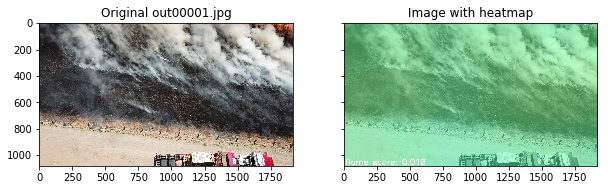

Inference:  100 / 10334
100


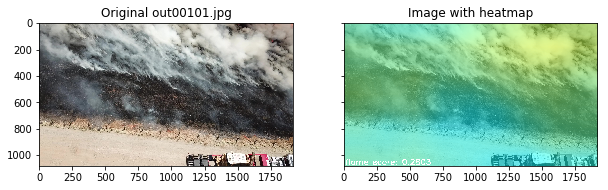

Inference:  200 / 10334
200


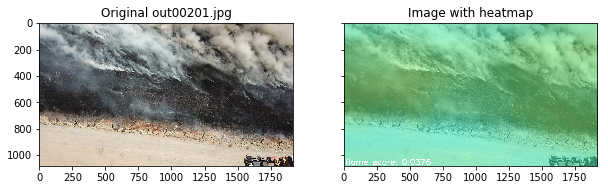

Inference:  300 / 10334
300


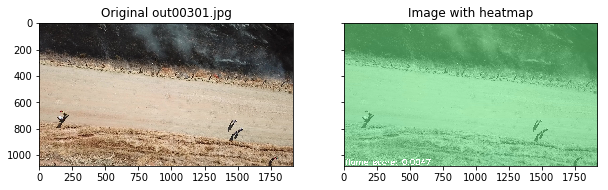

Inference:  400 / 10334
400


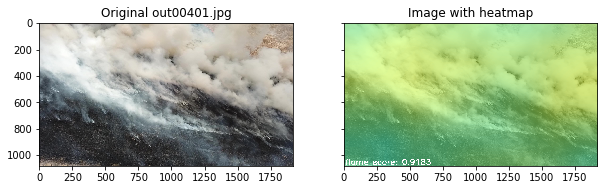

Inference:  500 / 10334
500


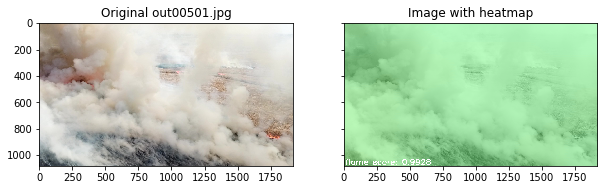

Inference:  600 / 10334
600


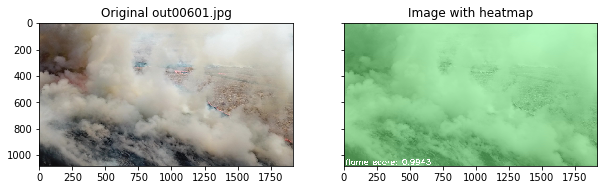

Inference:  700 / 10334
700


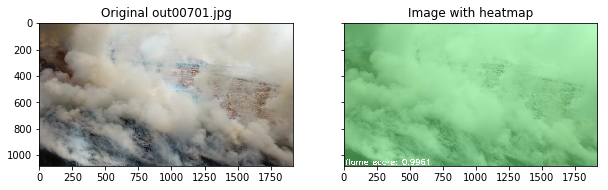

Inference:  800 / 10334
800


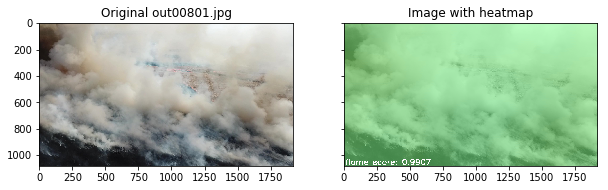

Inference:  900 / 10334
900


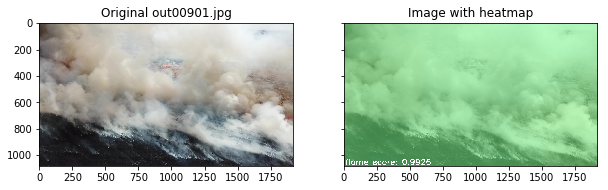

Inference:  1000 / 10334
1000


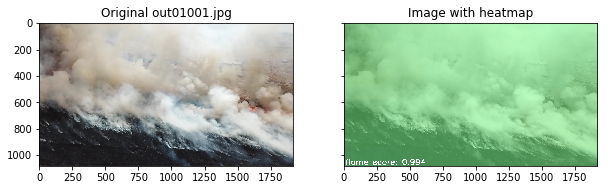

Inference:  1100 / 10334
1100


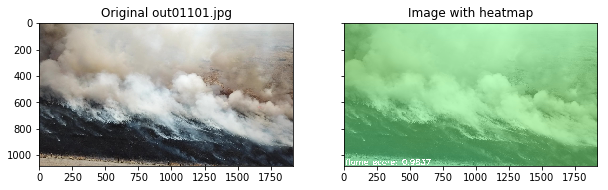

Inference:  1200 / 10334
1200


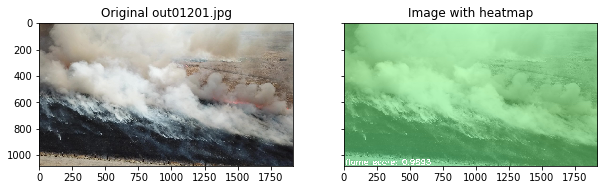

Inference:  1300 / 10334
1300


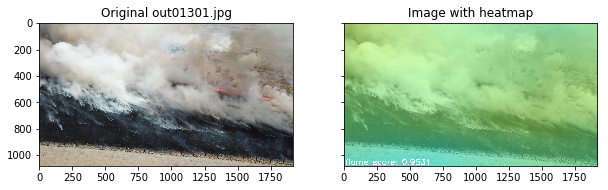

Inference:  1400 / 10334
1400


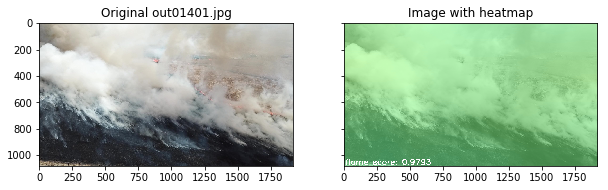

Inference:  1500 / 10334
1500


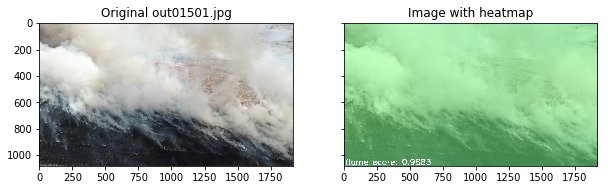

Inference:  1600 / 10334
1600


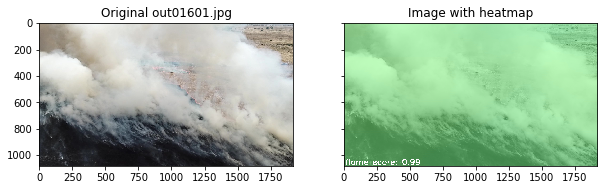

Inference:  1700 / 10334
1700


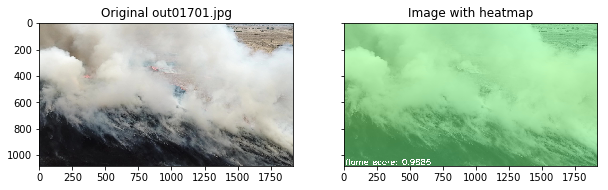

Inference:  1800 / 10334
1800


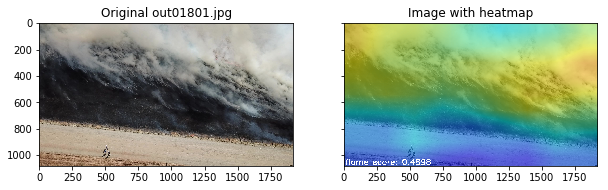

Inference:  1900 / 10334
1900


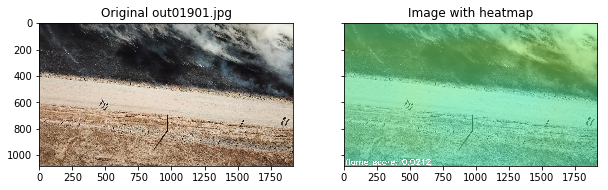

Inference:  2000 / 10334
2000


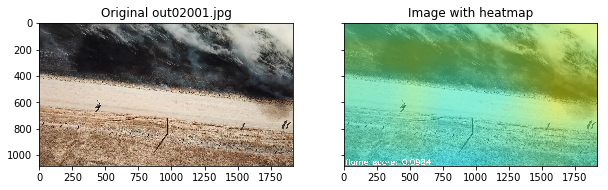

Inference:  2100 / 10334
2100


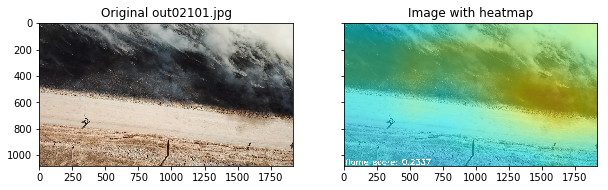

Inference:  2200 / 10334
2200


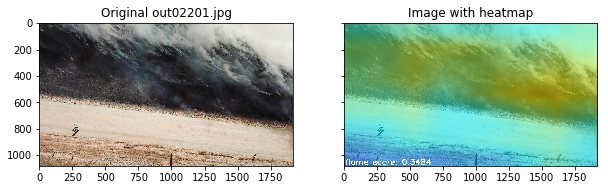

Inference:  2300 / 10334
2300


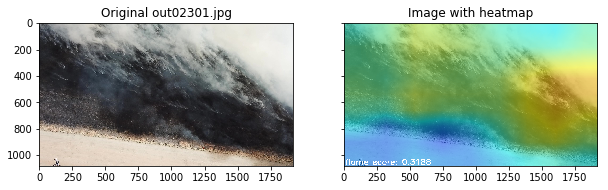

Inference:  2400 / 10334
2400


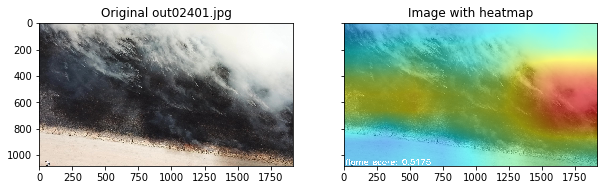

Inference:  2500 / 10334
2500


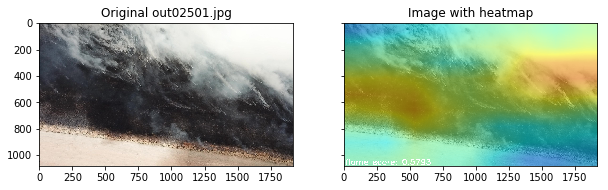

Inference:  2600 / 10334
2600


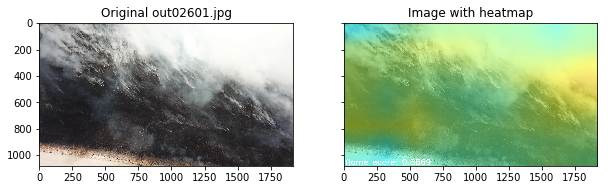

Inference:  2700 / 10334
2700


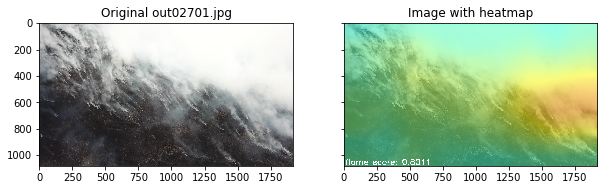

Inference:  2800 / 10334
2800


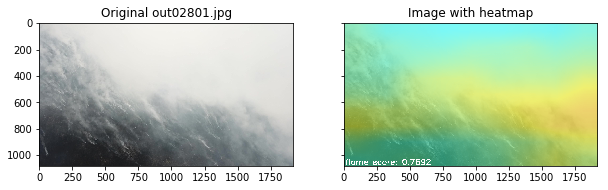

Inference:  2900 / 10334
2900


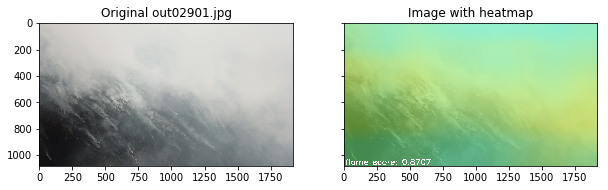

Inference:  3000 / 10334
3000


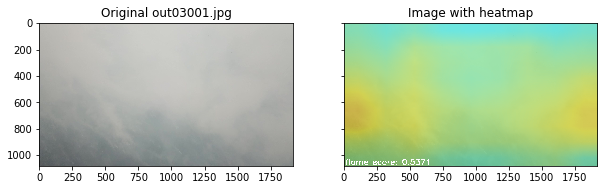

Inference:  3100 / 10334
3100


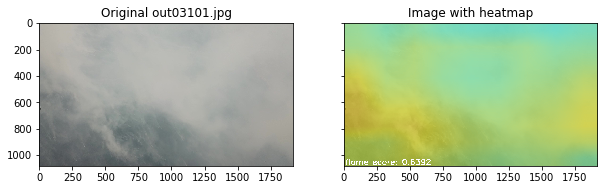

Inference:  3200 / 10334
3200


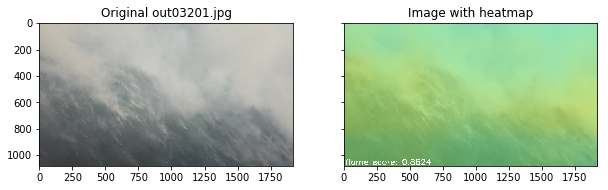

Inference:  3300 / 10334
3300


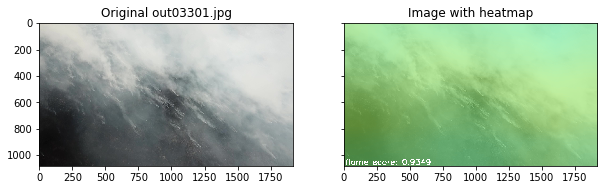

Inference:  3400 / 10334
3400


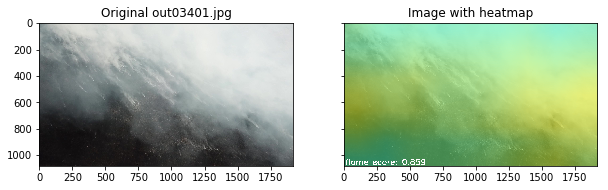

Inference:  3500 / 10334
3500


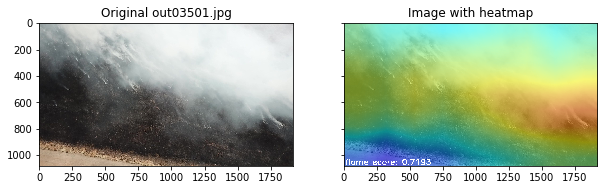

Inference:  3600 / 10334
3600


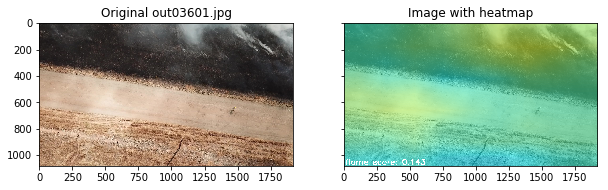

Inference:  3700 / 10334
3700


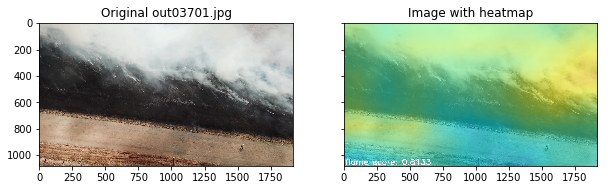

Inference:  3800 / 10334
3800


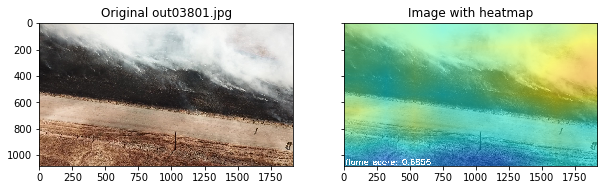

Inference:  3900 / 10334
3900


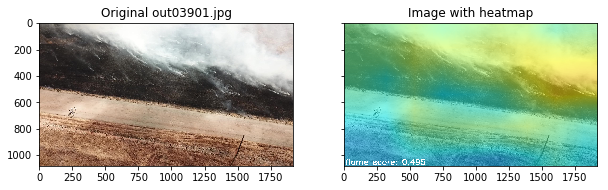

Inference:  4000 / 10334
4000


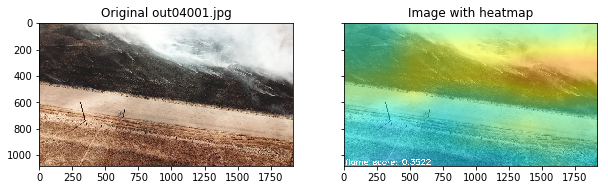

Inference:  4100 / 10334
4100


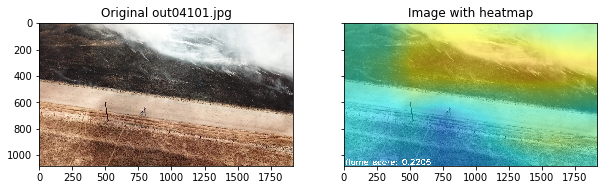

Inference:  4200 / 10334
4200


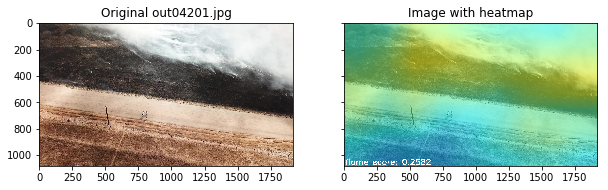

Inference:  4300 / 10334
4300


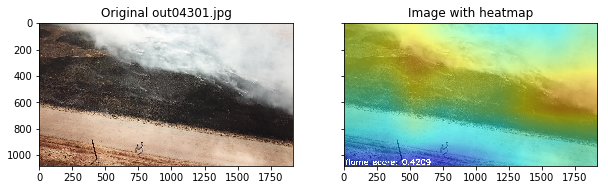

Inference:  4400 / 10334
4400


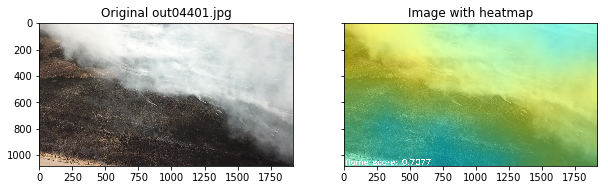

Inference:  4500 / 10334
4500


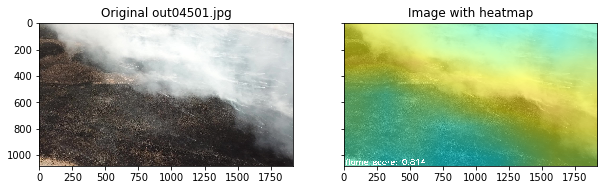

Inference:  4600 / 10334
4600


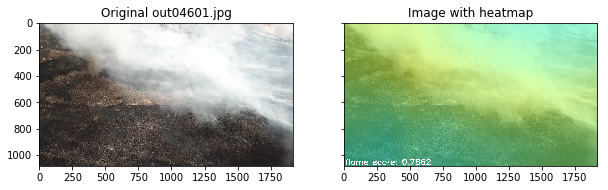

Inference:  4700 / 10334
4700


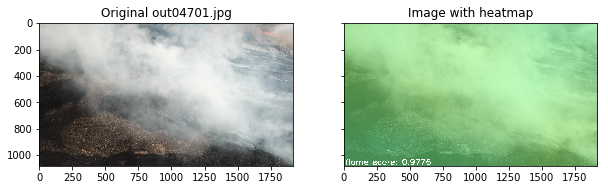

Inference:  4800 / 10334
4800


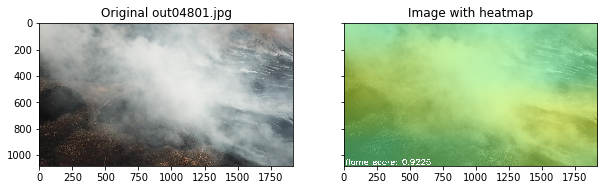

Inference:  4900 / 10334
4900


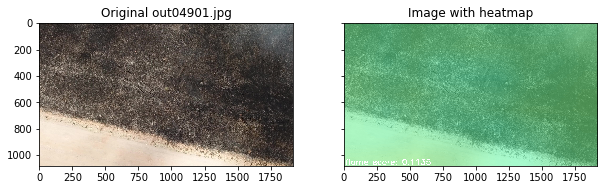

Inference:  5000 / 10334
5000


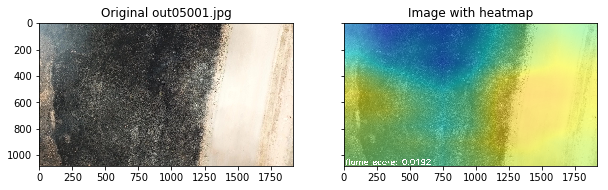

Inference:  5100 / 10334
5100


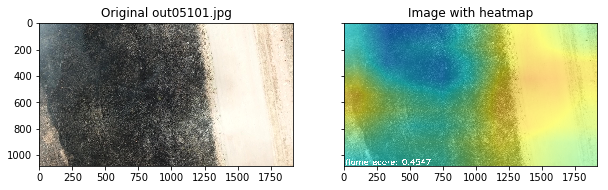

Inference:  5200 / 10334
5200


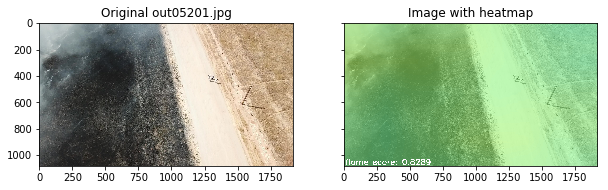

Inference:  5300 / 10334
5300


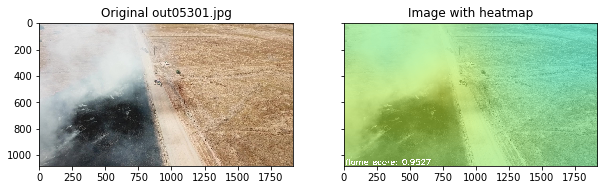

In [0]:
for idx, name in enumerate(image_names):
  if not idx % 100: print("Assembly: ", idx, "/", len(image_names))
  img_path = FRAMES_DIR + name
  
  img = cv2.imread(img_path)
  grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  grayimg = cv2.cvtColor(grayimg, cv2.COLOR_GRAY2BGR)
  
  hm = hm_normalized[idx]
  hm = cv2.resize(hm, (img.shape[1], img.shape[0]))
  hm = cv2.applyColorMap(hm, cv2.COLORMAP_JET)
  superimposed_img = np.uint8(0.5* hm + 0.5* grayimg)
  
  cv2.putText(superimposed_img, 'flame score: '+str(round(*scores_seconds[int(idx/60)],4)),
              (10, 1070), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), thickness=5)
  
  img_abs_path = HM_DIR+'hm_'+name.split('.')[0]+'.jpg'
  
  cv2.imwrite(HM_DIR+'hm_'+name.split('.')[0]+'.jpg', superimposed_img)
  
  #visualize every n images
  if(idx%100==0):
    print(idx)
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(10, 5))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original ' + name)
    ax2.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))  
    ax2.set_title('Image with heatmap')
    plt.show()

In [0]:
# ffmpeg conversions (back and forth)
#!ffmpeg -i '/gdrive/My Drive/fire_dataset/sacramento_test_burn/DJI_0003.MOV' -vf fps=30 -q:v 1 '/gdrive/My Drive/fire_dataset/sacramento_test_burn/DJI_0003_frames/out%5d.jpg'
#!ffmpeg -i /gdrive/My\ Drive/fire_dataset/sacramento_test_burn/DJI_0003_out/heatmaps/out%05d_heatmap.jpg /gdrive/My\ Drive/fire_dataset/sacramento_test_burn/DJI_0003_out/video_full.mp4

In [0]:
!ffmpeg -i /gdrive/My\ Drive/fire_dataset/sacramento_test_burn/DJI_0003_out/heatmaps/hm_out%05d.jpg /gdrive/My\ Drive/fire_dataset/sacramento_test_burn/DJI_0003_out/video_partial.mp4

ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --ena